In [1]:
import sys, os
from pathlib import Path
import matplotlib.pyplot as plt
sys.path.insert(0, str(Path(os.getcwd()).parent)) # add parent directory to path to import python files from there 

import segmentation_helper
import plotting
import data_loader

import warnings
warnings.filterwarnings("ignore")

## Predict masks for dataset

Predictions are made with every model in `MOD_DIR` for any image of a specific format (default= jpg) in the `PATH` directory.   
- `PATH` can contain sub-directories named 'train', 'test'; alternatively setting `do_subfolders=True` allows to use any existing subfolder.
- Images with 'flow','flows','masks'or 'mask' in the file name will be ignored.
- Mask will be stored by default as tif files. 

In [2]:
#set the path to the folder that contains the images for segmentation
PATH = "F:/cellpose/fh/train/"
#set the path to the folder that contains the trained model(s)
MOD_DIR = "F:/cellpose/fh/train/models/"

In [3]:
#run the segmentation
segmentation_helper.batch_predict(MOD_DIR,[PATH],mute=False,return_results=False,save_masks=True);

fh found...
Predicting for  F:/cellpose/fh/train/ ...


F:/cellpose/fh/train/: 100%|██████████| 6/6 [00:22<00:00,  3.73s/image]


Sucessfully created predictions for 6 image(s).
fh_boosted found...
Predicting for  F:/cellpose/fh/train/ ...


F:/cellpose/fh/train/: 100%|██████████| 6/6 [00:36<00:00,  6.13s/image]


Sucessfully created predictions for 6 image(s).
fh_boosted_2 found...
Predicting for  F:/cellpose/fh/train/ ...


F:/cellpose/fh/train/: 100%|██████████| 6/6 [00:21<00:00,  3.55s/image]

Sucessfully created predictions for 6 image(s).


## Predict masks for images in a specific folder   
This function takes in a directory containing images, and uses a pre-trained model to predict segmentation masks for the images.
If `return_results` is `True` respective lists of 1D arrays for predicted *masks*, *flows* and *styles* 
from `CellposeModel.eval()` are returned (see https://cellpose.readthedocs.io/en/latest/api.html#id5).

Parameters:
------------
`INP_DIR (str)` - Input directory 
model (obj) - Trained model from 'models.CellposeModel' class. Use either `models.CellposeModel(model_type='')` for built-in cellpose models or `models.CellposeModel(pretrained_model='')` for custom models. See https://cellpose.readthedocs.io/en/latest/models.html for more details.   
   
`image_format` (str(optional, default 'jpg')) - Image format of the images in `INP_DIR`   
`filter_str` (str(optional, default '')) - A string used to filter the images in `INP_DIR`   
`return_results` (bool(optional, default False)) - flag for returning predicted masks, flows and styles  
  
`TAR_DIR` (str(optional, default '')) - The directory to save the predicted masks to.  
`save_masks` (bool(optional, default True)) - flag for saving predicted mask as `.tif` files in `TAR_DIR`   
`mute` (bool (optional, default=False)) - flag for muting console output   
`mID` (str (optional, default = '')) - optional model name that will be written into output file names - will be later used to filter the results for a specific model.  

Parameters that can be handed down explicitly to `CellposeModel.eval()`,    
see https://cellpose.readthedocs.io/en/latest/api.html#id5 :   
   
`channels` (list (optional, default [0,0]))   
`diameter` (float (optional, default None))   
`rescale` (float (optional, default None))  
`min_size` (int (optional, default 15))    

In [14]:
#import the cellpose module for the model
from cellpose import models
#absolute path to images
PATH2 = "F:/cellpose/fh/train/"
#path to the trained model
MODEL_PATH = "F:/cellpose/fh/models/fh_boosted_1.170223"
#initialiize the model
model = models.CellposeModel(gpu=True, pretrained_model=MODEL_PATH)
#segement the images in PATH2
segmentation_helper.predict_folder(
    PATH2,image_format='jpg',diameter=None,
    return_results=False,model=model,save_masks=True,mute =False,mID='custom_model');

Predicting for  F:/cellpose/fh/train/ ...


F:/cellpose/fh/train/: 100%|██████████| 6/6 [00:37<00:00,  6.19s/image]

Sucessfully created predictions for 6 image(s).


### Inspect segmentations   
`imgs` list of image paths    
`preds` list of prediction paths   
`lbls` list of label paths (optional)  
`title` title of plot (optional)   
`PATH` path to save plot (optional)   

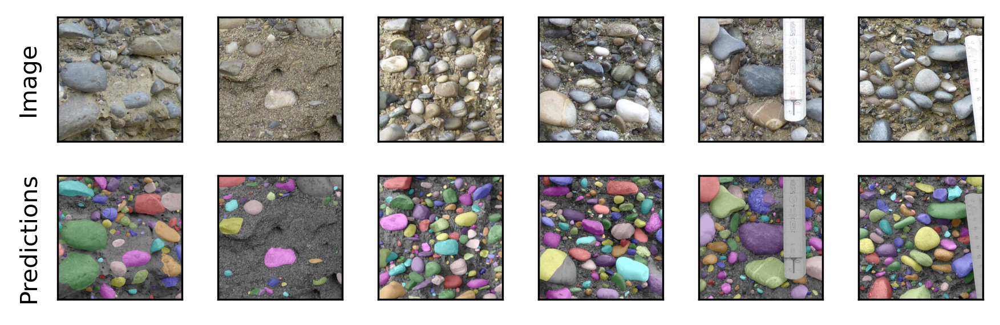

In [15]:
#load the images and predictions from PATH2
imgs,_,preds = data_loader.dataset_loader(PATH2,label_str='mask',pred_str='custom_model')
#show the results
pred_plot = plotting.inspect_predictions(imgs,preds,title='FH Predictions')

### Inspect segmentations, labels in images

In [6]:
#load the images and the predictions from file
imgs,lbls,preds = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_pred')
_,_,preds_boosted = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_pred')
_,_,preds_boosted_2 = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_2')

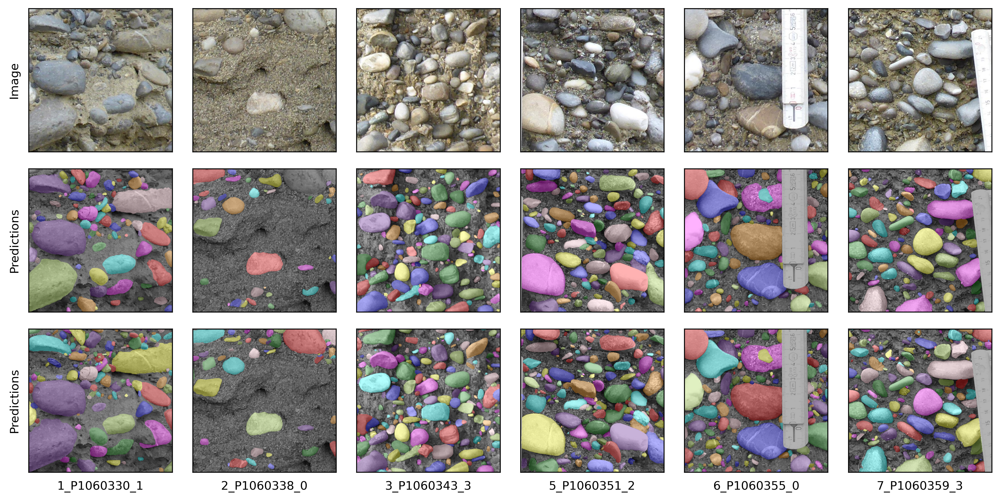

In [7]:
pred_label_plot = plotting.inspect_predictions(imgs,preds,lbls,title='FH Predictions')

## Evaluate segmentation performance

In [8]:
filters={'edge':[True,.05],'px_cutoff':[True,10]}

In [9]:
#eval mAP @ IoU
eval_results = segmentation_helper.eval_set(imgs,preds,lbls,dataID='FH',filters=filters)
eval_results_boosted = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted',filters=filters)
eval_results_boosted_2 = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted_2',filters=filters)

### Plot segmentation performance

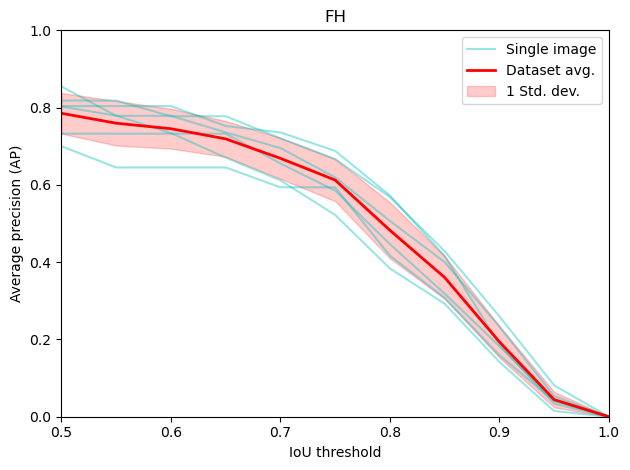

In [10]:
plotting.AP_IoU_plot(eval_results,title='FH');

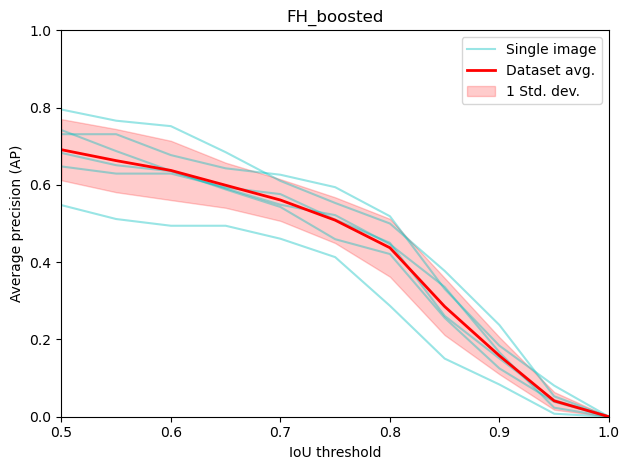

In [11]:
plotting.AP_IoU_plot(eval_results_boosted,title='FH_boosted');

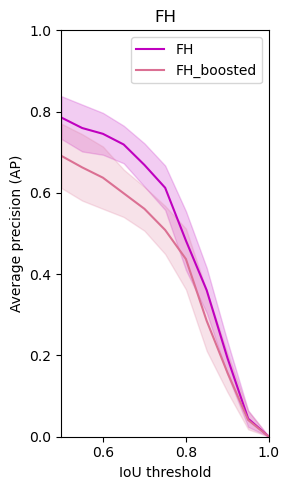

In [12]:
elem = {
    'dataset':'FH',
    'model_ID':['FH','FH_boosted'],
    'colors':['m','palevioletred'],
    'images':False,
    'SD':True,
    'avg_model':True
    }

plt.figure(figsize=(3,5))
plotting.AP_IoU_summary_plot([eval_results,eval_results_boosted],elem);